In [16]:
pip install tensorflow keras opencv-python numpy pandas matplotlib seaborn scikit-learn torch torchvision albumentations streamlit flask


Note: you may need to restart the kernel to use updated packages.


In [28]:
import os

image_folder = "/Users/kartik/kaggle/iqothnccd-lung-cancer-dataset/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset"
sample_images = os.listdir(image_folder)[:5]

for img_name in sample_images:
    img_path = os.path.join(image_folder, img_name)
    if not os.path.exists(img_path):
        print(f"File not found: {img_path}")


In [39]:
import os

dataset_path = "/Users/kartik/kaggle/iqothnccd-lung-cancer-dataset"  # Change this if needed

# List all files and folders in the dataset path
print("Contents of dataset directory:", os.listdir(dataset_path))


Contents of dataset directory: ['.DS_Store', 'Test cases', 'The IQ-OTHNCCD lung cancer dataset']


In [47]:
import os

dataset_path = "/Users/kartik/kaggle/iqothnccd-lung-cancer-dataset"  # Modify this if needed

# Print all files and folders inside the dataset directory
print("Dataset Contents:")
for root, dirs, files in os.walk(dataset_path):
    print(root)  # Print full path of each folder
    print("Subfolders:", dirs)
    print("Files:", files)
    print("-" * 50)


Dataset Contents:
/Users/kartik/kaggle/iqothnccd-lung-cancer-dataset
Subfolders: ['Test cases', 'The IQ-OTHNCCD lung cancer dataset']
Files: ['.DS_Store']
--------------------------------------------------
/Users/kartik/kaggle/iqothnccd-lung-cancer-dataset/Test cases
Subfolders: []
Files: ['001337_01_02_176.png', '000138_01_01_114.png', '000054_03_01_025.png', '000315_04_03_145.png', '000063_01_01_155.png', '000276_05_02_188.png', '000293_06_03_161.png', '000103_07_02_160.png', '000569_08_01_020.png', '000105_03_01_162.png', '000143_05_01_116.png', '000143_04_02_126.png', '000027_04_01_119.png', '001230_03_02_148.png', '000020_02_01_062.png', '000054_03_01_018.png', '000247_05_01_178.png', '000058_07_01_195.png', '000310_01_01_115.png', '000293_06_03_176.png', '000103_08_01_016.png', '000874_03_02_219.png', '000021_03_01_017.png', '000198_05_01_124.png', '000238_09_03_124.png', '000103_02_01_107.png', '002276_05_03_078.png', '003601_02_01_076.png', '000027_02_01_105.png', '000019_03_01

In [49]:
dataset_path = "/Users/kartik/kaggle/iqothnccd-lung-cancer-dataset/The IQ-OTHNCCD lung cancer dataset/Dataset"



In [53]:
dataset_path = "/Users/kartik/kaggle/iqothnccd-lung-cancer-dataset/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset"


In [55]:
categories = ["Bengin cases", "Malignant cases", "Normal cases"]


✅ Dataset found! Loading images...


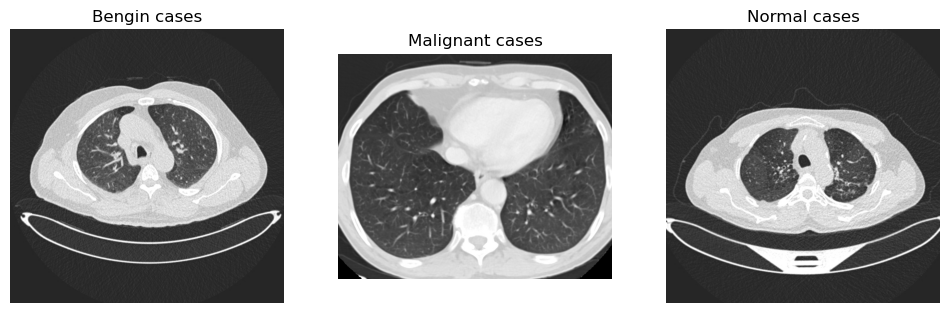

In [59]:
import os
import cv2
import matplotlib.pyplot as plt

# Set the correct dataset path
dataset_path = "/Users/kartik/kaggle/iqothnccd-lung-cancer-dataset/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset"

# Define categories (subfolders)
categories = ["Bengin cases", "Malignant cases", "Normal cases"]

# Check dataset existence
if not os.path.exists(dataset_path):
    print(f"❌ Error: Dataset path '{dataset_path}' does not exist!")
    exit()

print("✅ Dataset found! Loading images...")

# Plot sample images
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

for i, category in enumerate(categories):
    category_path = os.path.join(dataset_path, category)
    
    if not os.path.exists(category_path):
        print(f"⚠️ Warning: {category_path} does not exist. Skipping {category}.")
        continue

    sample_images = os.listdir(category_path)
    if len(sample_images) == 0:
        print(f"⚠️ No images found in {category_path}")
        continue
    
    img_path = os.path.join(category_path, sample_images[0])

    img = cv2.imread(img_path)

    if img is None:
        print(f"❌ Error loading image: {img_path}")
        continue

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[i].imshow(img)
    axes[i].set_title(category)
    axes[i].axis("off")

plt.show()


In [61]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set dataset path
dataset_path = "/Users/kartik/kaggle/iqothnccd-lung-cancer-dataset/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset"
categories = ["Bengin cases", "Malignant cases", "Normal cases"]

# Image settings
IMG_SIZE = 224  # Resize images to 224x224
data = []
labels = []

for category in categories:
    category_path = os.path.join(dataset_path, category)
    label = categories.index(category)  # Assign numeric label

    for img_name in os.listdir(category_path):
        img_path = os.path.join(category_path, img_name)
        img = cv2.imread(img_path)
        
        if img is None:
            continue  # Skip unreadable images
        
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))  # Resize image
        img = img / 255.0  # Normalize pixels to [0,1]
        
        data.append(img)
        labels.append(label)

# Convert to NumPy arrays
data = np.array(data, dtype="float32")
labels = np.array(labels)

# Print dataset shape
print("✅ Preprocessing Complete!")
print(f"Dataset Shape: {data.shape}, Labels Shape: {labels.shape}")


✅ Preprocessing Complete!
Dataset Shape: (1097, 224, 224, 3), Labels Shape: (1097,)


In [63]:
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split

# Split dataset into train and test
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=42)

# Build CNN Model
model = models.Sequential([
    layers.Conv2D(32, (3,3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)),
    layers.MaxPooling2D(2,2),

    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D(2,2),

    layers.Conv2D(128, (3,3), activation='relu'),
    layers.MaxPooling2D(2,2),

    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(3, activation='softmax')  # 3 classes (benign, malignant, normal)
])

# Compile Model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train Model
model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test))

# Save Model
model.save("lung_cancer_cnn.h5")
print("✅ Model training complete and saved as lung_cancer_cnn.h5")


/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 32s 1s/step - accuracy: 0.4613 - loss: 1.8872 - val_accuracy: 0.6364 - val_loss: 0.8011
Epoch 2/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 32s 1s/step - accuracy: 0.7416 - loss: 0.6605 - val_accuracy: 0.7682 - val_loss: 0.6135
Epoch 3/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 31s 1s/step - accuracy: 0.8639 - loss: 0.3623 - val_accuracy: 0.9136 - val_loss: 0.2969
Epoch 4/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step - accuracy: 0.9698 - loss: 0.1238 - val_accuracy: 0.9318 - val_loss: 0.2354
Epoch 5/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 34s 1s/step - accuracy: 0.9832 - loss: 0.0589 - val_accuracy: 0.9364 - val_loss: 0.3033
Epoch 6/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 32s 1s/step - accuracy: 0.9806 - loss: 0.0527 - val_accuracy: 0.9500 - val_loss: 0.1981
Epoch 7/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 31s 1s/step - accuracy: 0.9907 - loss: 0.0245 - val_accuracy: 0.9500 - val_loss: 0.2496
Epoch 8/10
28/28 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step - accuracy: 0.9893 - loss: 0.0344 - val_accuracy: 0.9682 - val_loss:

✅ Model training complete and saved as lung_cancer_cnn.h5


In [65]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Set test dataset path
test_path = "/Users/kartik/kaggle/iqothnccd-lung-cancer-dataset/Test cases"

# Image settings
IMG_SIZE = 224  # Same size as training data
test_images = []
image_names = []

# Load test images
for img_name in os.listdir(test_path):
    img_path = os.path.join(test_path, img_name)
    
    img = cv2.imread(img_path)
    
    if img is None:
        print(f"⚠️ Skipping unreadable file: {img_name}")
        continue
    
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))  # Resize image
    img = img / 255.0  # Normalize pixel values

    test_images.append(img)
    image_names.append(img_name)

# Convert to NumPy array
test_images = np.array(test_images, dtype="float32")

print(f"✅ Loaded {len(test_images)} test images!")


✅ Loaded 197 test images!


In [67]:
# Load the trained model
model = tf.keras.models.load_model("lung_cancer_cnn.h5")  # Ensure the model file is in the same directory

# Make predictions
predictions = model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)

# Class names
class_names = ["Benign", "Malignant", "Normal"]

# Print results
for i, img_name in enumerate(image_names):
    print(f"🖼 Image: {img_name} ➝ Predicted: {class_names[predicted_classes[i]]}")


7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 279ms/step
🖼 Image: 001337_01_02_176.png ➝ Predicted: Malignant
🖼 Image: 000138_01_01_114.png ➝ Predicted: Benign
🖼 Image: 000054_03_01_025.png ➝ Predicted: Malignant
🖼 Image: 000315_04_03_145.png ➝ Predicted: Normal
🖼 Image: 000063_01_01_155.png ➝ Predicted: Malignant
🖼 Image: 000276_05_02_188.png ➝ Predicted: Normal
🖼 Image: 000293_06_03_161.png ➝ Predicted: Malignant
🖼 Image: 000103_07_02_160.png ➝ Predicted: Normal
🖼 Image: 000569_08_01_020.png ➝ Predicted: Malignant
🖼 Image: 000105_03_01_162.png ➝ Predicted: Malignant
🖼 Image: 000143_05_01_116.png ➝ Predicted: Benign
🖼 Image: 000143_04_02_126.png ➝ Predicted: Malignant
🖼 Image: 000027_04_01_119.png ➝ Predicted: Malignant
🖼 Image: 001230_03_02_148.png ➝ Predicted: Malignant
🖼 Image: 000020_02_01_062.png ➝ Predicted: Malignant
🖼 Image: 000054_03_01_018.png ➝ Predicted: Malignant
🖼 Image: 000247_05_01_178.png ➝ Predicted: Malignant
🖼 Image: 000058_07_01_195.png ➝ Predicted: Malignant
🖼 Image: 000310_01_01_

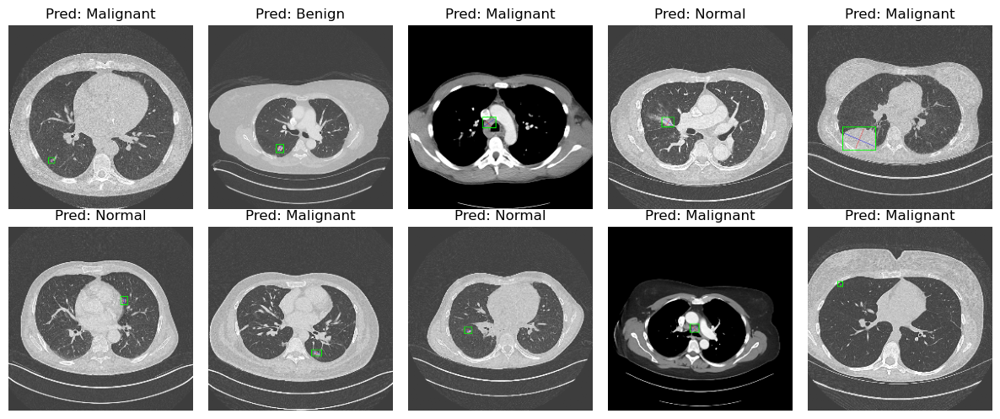

In [79]:
# Plot sample test images with predictions
fig, axes = plt.subplots(2, 5, figsize=(12, 5))

for i in range(min(10, len(test_images))):  # Show up to 10 images
    img = test_images[i]
    pred_label = class_names[predicted_classes[i]]

    ax = axes[i // 5, i % 5]
    ax.imshow(img)
    ax.set_title(f"Pred: {pred_label}")
    ax.axis("off")

plt.tight_layout()
plt.show()


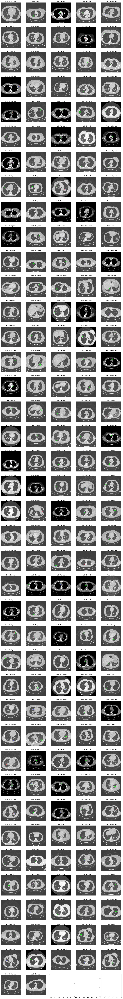

In [85]:
import matplotlib.pyplot as plt
import math

# Define the number of images to display
num_images = len(test_images)

# Calculate grid size
rows = math.ceil(num_images / 5)  # Adjust rows dynamically
cols = min(5, num_images)  # Maximum 5 columns

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))

for i in range(num_images):
    img = test_images[i]
    pred_label = class_names[predicted_classes[i]]

    ax = axes[i // 5, i % 5] if rows > 1 else axes[i % 5]  # Adjust for 1-row case
    ax.imshow(img)
    ax.set_title(f"Pred: {pred_label}")
    ax.axis("off")

plt.tight_layout()
plt.show()